# ***Pruebas Hechas por Julián León***

## ***VNIR image .TIF***

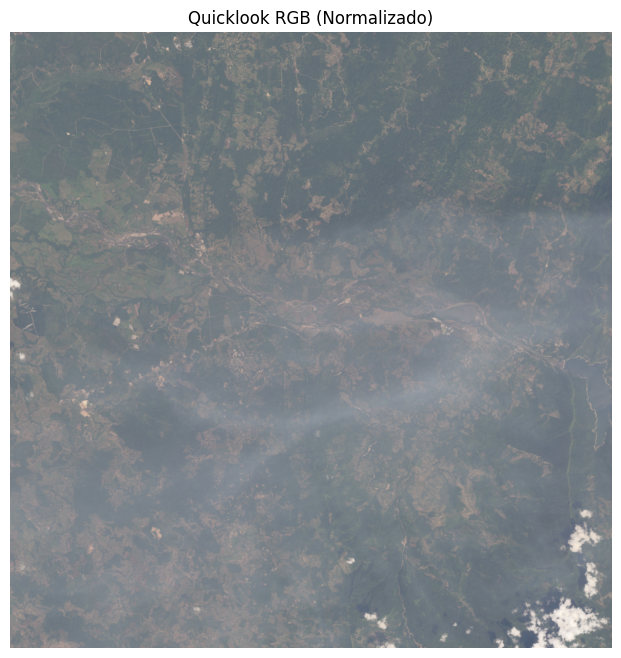

(1024, 1000)


In [2]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Ruta del archivo
path = '/home/jleon13/Documents/Proyecto_5/ENMAP.HSI.L1B-20250531T123321Z-1-001/ENMAP.HSI.L1B/ENMAP01_003_V010502_20250506T214732Z/ENMAP01-____L1B-DT0000058231_20240123T155834Z_003_V010502_20250506T214732Z-QL_VNIR.TIF'
# Abrir y leer bandas RGB
with rasterio.open(path) as src:
    r = src.read(1)
    g = src.read(2)
    b = src.read(3)

# Apilar en una imagen RGB
rgb = np.stack([r, g, b], axis=-1)

# Normalizar a [0, 1] si los valores son muy altos
rgb_norm = rgb / np.max(rgb)

# Visualización
plt.figure(figsize=(8, 8))
plt.imshow(rgb_norm)
plt.axis('off')
plt.title("Quicklook RGB (Normalizado)")
plt.show()

print(src.shape)


## ***SWIR image .HDR***

	Data Source:   '/home/jleon13/Documents/Proyecto_5/ENMAP.HSI.L1B-20250531T123321Z-1-001/ENMAP.HSI.L1B/ENMAP01_003_V010502_20250506T214732Z/ENMAP01-____L1B-DT0000058231_20240123T155834Z_003_V010502_20250506T214732Z-SPECTRAL_IMAGE_SWIR.BSQ'
	# Rows:           1024
	# Samples:        1000
	# Bands:           133
	Interleave:        BSQ
	Quantization:  16 bits
	Data format:    uint16
Dimensiones: (1024, 1000, 133)
Forma del array de datos: (1024, 1000, 133)
Mínimo: 1.0
Máximo: 65535.0
Media: 20548.627


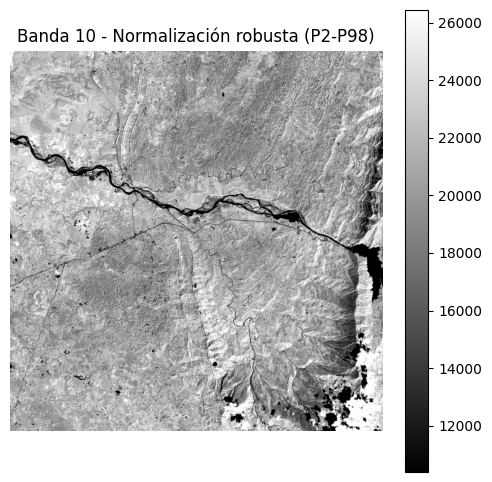

In [6]:
from spectral import open_image

# Ruta al archivo .HDR (que referencia al .BSQ)
hdr_path = '/home/jleon13/Documents/Proyecto_5/ENMAP.HSI.L1B-20250531T123321Z-1-001/ENMAP.HSI.L1B/ENMAP01_003_V010502_20250506T214732Z/ENMAP01-____L1B-DT0000058231_20240123T155834Z_003_V010502_20250506T214732Z-SPECTRAL_IMAGE_SWIR.HDR'
img = open_image(hdr_path)
print(img)
print(f"Dimensiones: {img.shape}")  # (filas, columnas, bandas)

# Leer todos los datos como un numpy array
data = img.load()
print("Forma del array de datos:", data.shape)

# Extraer la banda 10
banda_10 = np.squeeze(data[:, :, 10])
print("Mínimo:", np.min(banda_10))
print("Máximo:", np.max(banda_10))
print("Media:", np.mean(banda_10))

# Normalización robusta (percentiles 2-98)
vmin = np.percentile(banda_10, 2)
vmax = np.percentile(banda_10, 98)

plt.figure(figsize=(6, 6))
plt.imshow(banda_10, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Banda 10 - Normalización robusta (P2-P98)')
plt.colorbar()
plt.axis('off')
plt.show()


Dimensiones usando rasterio: (4, 1024, 1000)

Información de la banda 10:
Forma: (4, 1024)
Tipo de datos: uint8
Mínimo: 22
Máximo: 255
Media: 182.40185546875


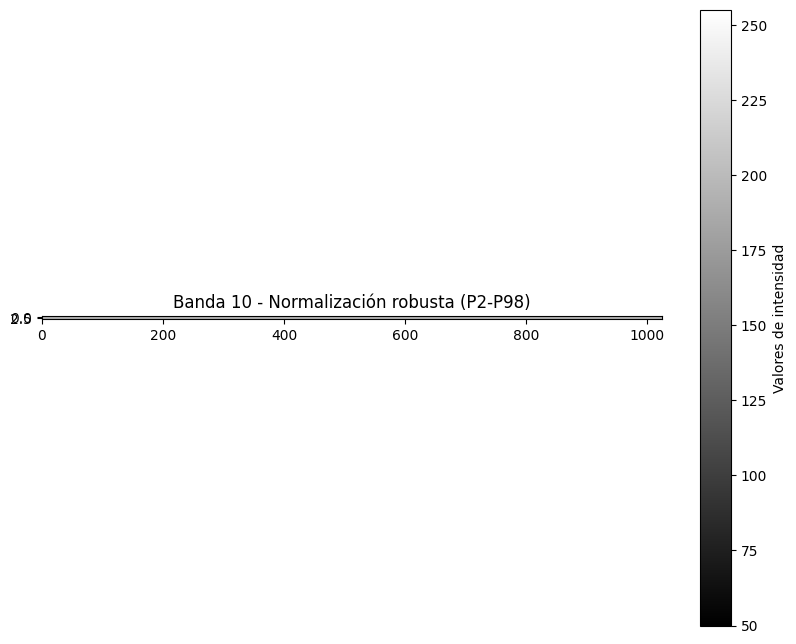

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import rasterio

# Ruta al archivo TIFF
tiff_path = '/home/jleon13/Documents/Proyecto_5/ENMAP.HSI.L1B-20250531T123321Z-1-001/l/ENMAP01-____L1B-DT0000086892_20240810T154338Z_001_V010502_20250604T034334Z/ENMAP01-____L1B-DT0000086892_20240810T154338Z_001_V010502_20250604T034334Z-QL_SWIR.TIF'

# Intentar primero con rasterio
try:
    with rasterio.open(tiff_path) as src:
        data = src.read()  # Esto lee todas las bandas
        print("Dimensiones usando rasterio:", data.shape)
except:
    # Si rasterio falla, intentar con tifffile
    try:
        data = tifffile.imread(tiff_path)
        print("Dimensiones usando tifffile:", data.shape)
    except Exception as e:
        print(f"Error al leer el archivo: {e}")
        raise

# Reorganizar dimensiones si es necesario
if len(data.shape) == 3:
    if data.shape[0] == 3:  # Si las bandas están primero
        data = np.moveaxis(data, 0, -1)  # Mover bandas al final
    banda_10 = data[:, :, 10]
else:
    banda_10 = data[10]

# Verificar y mostrar información
print("\nInformación de la banda 10:")
print("Forma:", banda_10.shape)
print("Tipo de datos:", banda_10.dtype)
print("Mínimo:", np.min(banda_10))
print("Máximo:", np.max(banda_10))
print("Media:", np.mean(banda_10))

# Normalización robusta
vmin = np.percentile(banda_10, 2)
vmax = np.percentile(banda_10, 98)

# Visualización con más controles
plt.figure(figsize=(10, 8))
plt.imshow(banda_10, cmap='gray', vmin=vmin, vmax=vmax)
plt.colorbar(label='Valores de intensidad')
plt.title('Banda 10 - Normalización robusta (P2-P98)')
plt.axis('on')  # Mostrar ejes para debuggear
plt.grid(True)  # Agregar cuadrícula para referencia
plt.show()

# Forzar la visualización
plt.close('all')  # Limpiar figuras anteriores

### ***Resolution Image SWIR***

dict_keys(['description', 'samples', 'lines', 'bands', 'header offset', 'file type', 'data type', 'interleave', 'byte order', 'map info', 'band names', 'wavelength', 'fwhm', 'data ignore value', 'wavelength units', 'data gain values', 'data offset values'])
Banda 0: 901.962 nm
Banda 1: 911.572 nm
Banda 2: 921.32 nm
Banda 3: 931.204 nm
Banda 4: 941.218 nm
Banda 5: 951.361 nm
Banda 6: 961.629 nm
Banda 7: 972.017 nm
Banda 8: 982.524 nm
Banda 9: 993.145 nm
Banda 10: 1003.88 nm
Banda 11: 1014.72 nm
Banda 12: 1025.66 nm
Banda 13: 1036.7 nm
Banda 14: 1047.84 nm
Banda 15: 1059.07 nm
Banda 16: 1070.39 nm
Banda 17: 1081.79 nm
Banda 18: 1093.26 nm
Banda 19: 1104.81 nm
Banda 20: 1116.43 nm
Banda 21: 1128.11 nm
Banda 22: 1139.84 nm
Banda 23: 1151.62 nm
Banda 24: 1163.44 nm
Banda 25: 1175.31 nm
Banda 26: 1187.2 nm
Banda 27: 1199.11 nm
Banda 28: 1211.05 nm
Banda 29: 1223.0 nm
Banda 30: 1234.97 nm
Banda 31: 1246.95 nm
Banda 32: 1258.93 nm
Banda 33: 1270.92 nm
Banda 34: 1282.92 nm
Banda 35: 1294.91 nm


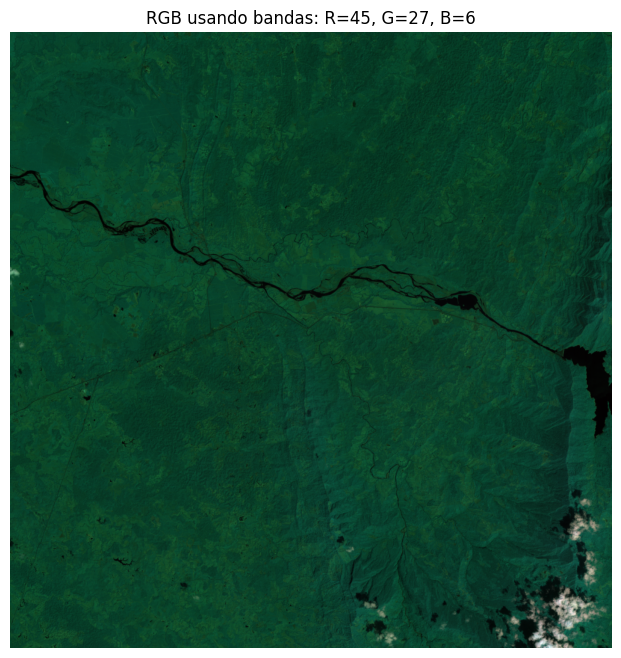

In [3]:
#@title **CODE:** Intento de vizualización en RGB desde el .HDR

hdr = img.metadata
print(hdr.keys())  # Mostrar todas las claves de metadata
wavelengths = hdr['wavelength'] #Longitudes de onda por banda
wavelengths = [float(w) for w in wavelengths]
for i, w in enumerate(wavelengths):
    print(f"Banda {i}: {w} nm")

# Número de la banda 45, 27, 6
data = img.load()

r_band = 45
g_band = 27
b_band = 6
r = np.squeeze(data[:, :, r_band])
g = np.squeeze(data[:, :, g_band])
b = np.squeeze(data[:, :, b_band])

rgb = np.stack([r, g, b], axis=-1)
rgb_norm = (rgb - rgb.min()) / (rgb.max() - rgb.min())

plt.figure(figsize=(8,8))
plt.imshow(rgb_norm)
plt.title(f'RGB usando bandas: R={r_band}, G={g_band}, B={b_band}')
plt.axis('off')
plt.show()


## ***Factor Analysis, PCA, K-Means, Match Filter***

Tamaños de cada cluster inicial:
  Cluster 00: 18 píxeles ⚠️ PEQUEÑO
  Cluster 01: 90595 píxeles
  Cluster 02: 172912 píxeles
  Cluster 03: 241362 píxeles
  Cluster 04: 280161 píxeles
  Cluster 05: 17803 píxeles
  Cluster 06: 104197 píxeles
  Cluster 07: 83035 píxeles
  Cluster 08: 26202 píxeles
  Cluster 09: 7715 píxeles

Clusters pequeños detectados: [0]
Tamaños de cluster tras reasignar pequeños:
  Cluster 00: 0 píxeles ⚠️ PEQUEÑO
  Cluster 01: 90595 píxeles
  Cluster 02: 172912 píxeles
  Cluster 03: 241362 píxeles
  Cluster 04: 280179 píxeles
  Cluster 05: 17803 píxeles
  Cluster 06: 104197 píxeles
  Cluster 07: 83035 píxeles
  Cluster 08: 26202 píxeles
  Cluster 09: 7715 píxeles
⚠️  Cluster 0 aún pequeño (n=0 < B=133). Intentaremos regularizar más.
   • Advertencia: cluster 0 muy mal condicionado, se usó fallback de identidad/epsilon=1.0e+00


/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/tmp/ipykernel_560/4061638414.py:122: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov_k = np.cov(pixels_k, rowvar=False)  # (133, 133)
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encounte

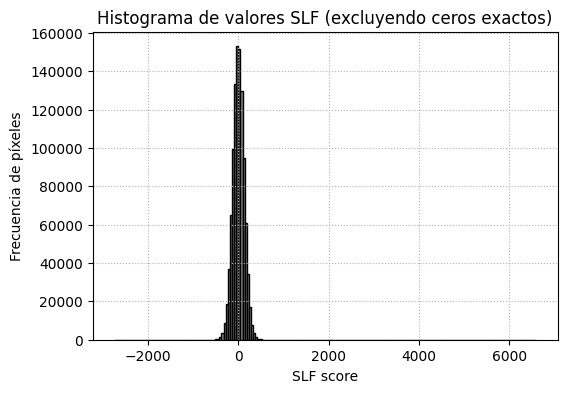

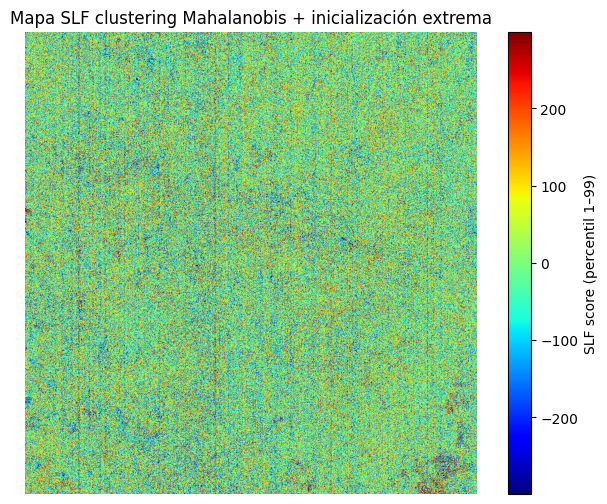

/tmp/ipykernel_560/4061638414.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  num_sint = float(diff_sint.T @ covinv_k @ t_vec)
/tmp/ipykernel_560/4061638414.py:200: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  den_sint = float(t_vec.T @ covinv_k @ t_vec)
/tmp/ipykernel_560/4061638414.py:204: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  num_fondo = float(diff_fondo.T @ covinv_k @ t_vec)



SLF fondo original (cluster 5 ): 69.9857515538601
SLF pixel sintético (cluster 5 ): 70.08575155386188

PCA: retenemos 99.85% de varianza con p=10 (clustering PCA)


/tmp/ipykernel_560/4061638414.py:260: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  num  = float(diff.T @ covs_inv_pca[k] @ t_vec)
/tmp/ipykernel_560/4061638414.py:261: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  den_k = float(t_vec.T @ covs_inv_pca[k] @ t_vec)



Contraste SLF (Mahalanobis) = 598.0181
Contraste SLF (PCA)         = 595.9896


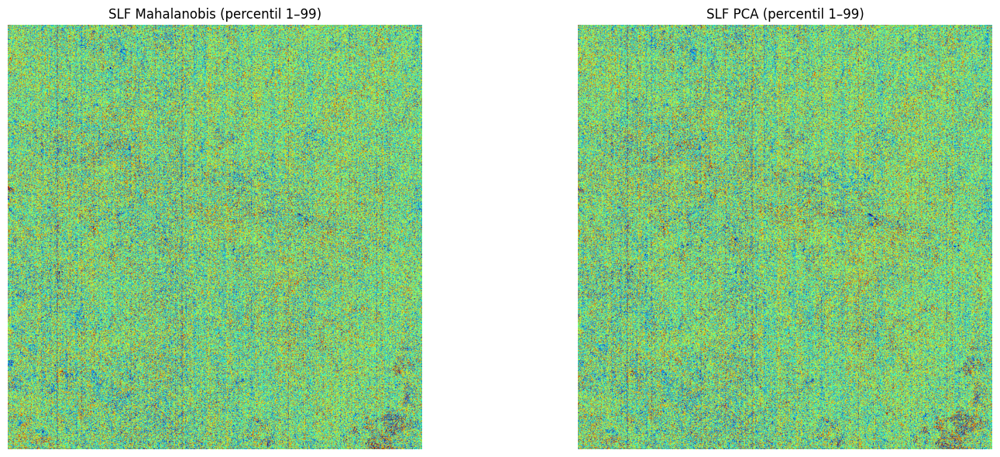

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from collections import Counter

# -------------------------------------------------------------------------
# PASO A: CARGAR DATOS DE IMAGEN SWIR Y FIRMA NORMALIZADA
# -------------------------------------------------------------------------
# data   → 3D array (R x C x B), B = 133 bandas
# hdr['wavelength'] → array de 133 longitudes de onda (nm)

# 1) Leer firma H₂O ya filtrada (λ en nm + atenuación normalizada)
firma = np.loadtxt('/home/jleon13/Documents/Proyecto_5/CH4_atenuation_filtered.txt')  # shape = (N_f, 2)
w_firma_orig = firma[:, 0]     # columnas originales de la firma (en nm)
a_firma_orig = firma[:, 1]     # atenuación normalizada (dim N_f)

# 2) Leer longitudes del header y datos de imagen
wavelengths_img = np.array([float(w) for w in hdr['wavelength']])  # vector (133,)

# 3) Interpolar la atenuación de la firma a las longitudes de onda de la imagen SWIR
a_firma_interp = np.interp(wavelengths_img, w_firma_orig, a_firma_orig)
#    Ahora a_firma_interp tiene longitud 133, alineada con wavelengths_img.

# 4) Firma como vector columna (133 × 1) ya alineado
t_vec = a_firma_interp.reshape(-1, 1)  # shape = (133, 1)

# -------------------------------------------------------------------------
# PASO B: PREPARAR PÍXELES E INFORMACIÓN GLOBAL
# -------------------------------------------------------------------------
R, C, B = data.shape
pixels = data.reshape(-1, B)  # (R*C, 133)

# Media global del fondo
mu_global = np.mean(pixels, axis=0).reshape(-1, 1)  # (133, 1)

# Covarianza global del fondo
cov_global = np.cov(pixels, rowvar=False)            # (133, 133)
# Pseudoinversa para detectar el cluster del píxel sintético
cov_global_inv = np.linalg.pinv(cov_global)

# -------------------------------------------------------------------------
# PASO C: CLUSTERING EN ESPACIO MAHALANOBIS + INICIALIZACIÓN “EXTREMA”
# -------------------------------------------------------------------------
n_clusters = 10  # número de clusters, reducir para evitar clusters muy pequeños

# 1) Preparar “whitening” global para Mahalanobis
eigvals, eigvecs = np.linalg.eigh(cov_global)
eps_eig = 1e-6
eigvals_clipped = np.maximum(eigvals, eps_eig)
cov_global_inv_sqrt = eigvecs @ np.diag(1.0 / np.sqrt(eigvals_clipped)) @ eigvecs.T  # (133,133)

# 2) Whiten de los píxeles: (x - μ) · Σ^{-1/2}
pixels_centered = pixels - mu_global.ravel()          # (N, 133)
pixels_whitened = pixels_centered @ cov_global_inv_sqrt  # (N, 133)
N = pixels_whitened.shape[0]

# 3) Inicialización extrema basada en PC1 de pixels_whitened
pca_init = PCA(n_components=1, random_state=0)
pc1_scores = pca_init.fit_transform(pixels_whitened).ravel()  # (N,)
sorted_idx = np.argsort(pc1_scores)
positions = (np.linspace(0, N - 1, n_clusters)).astype(int)
init_centroids = pixels_whitened[sorted_idx[positions]]       # (n_clusters, 133)

# 4) Ejecutar KMeans con init personalizado ("extremo" + Mahalanobis)
kmeans = KMeans(
    n_clusters=n_clusters,
    init=init_centroids,
    n_init=1,            # ya usamos init personalizado
    max_iter=300,
    random_state=0
)
labels = kmeans.fit_predict(pixels_whitened)  # (N,)
labels_img = labels.reshape(R, C)             # (R, C)

# Chequear tamaños de cluster
counts = Counter(labels)
print("Tamaños de cada cluster inicial:")
for k in range(n_clusters):
    marcado = " ⚠️ PEQUEÑO" if counts[k] < B else ""
    print(f"  Cluster {k:02d}: {counts[k]} píxeles{marcado}")

# -------------------------------------------------------------------------
# PASO D: REDUCIR O REASIGNAR CLUSTERS DEMASIADO PEQUEÑOS
# -------------------------------------------------------------------------
small_labels = [k for k, n_k in counts.items() if n_k < B]
if small_labels:
    print("\nClusters pequeños detectados:", small_labels)
    # Reasignamos cada pixel de esos clusters al cluster más poblado restante
    for k_small in small_labels:
        idx_small = np.where(labels == k_small)[0]  # índices lineales
        # Elegimos el cluster más poblado que no sea k_small
        k_target = max(((k, n) for k, n in counts.items() if k != k_small),
                       key=lambda x: x[1])[0]
        labels[idx_small] = k_target
    # Recalcular conteos tras reasignar
    counts = Counter(labels)
    print("Tamaños de cluster tras reasignar pequeños:")
    for k in range(n_clusters):
        marcado = " ⚠️ PEQUEÑO" if counts[k] < B else ""
        print(f"  Cluster {k:02d}: {counts[k]} píxeles{marcado}")
    labels_img = labels.reshape(R, C)

# -------------------------------------------------------------------------
# PASO E: CALCULAR MEDIAS Y COVARIANZAS REGULARIZADAS POR CLUSTER
# -------------------------------------------------------------------------
means = []
covs_inv = []
base_epsilon = 1e-3  # epsilon inicial para regularización

for k in range(n_clusters):
    idx_k = (labels == k)
    pixels_k = pixels[idx_k]  # (n_k, 133)
    n_k = pixels_k.shape[0]
    if n_k < B:
        print(f"⚠️  Cluster {k} aún pequeño (n={n_k} < B={B}). Intentaremos regularizar más.")

    # Media de cluster k
    mean_k = np.mean(pixels_k, axis=0).reshape(-1, 1)  # (133, 1)

    # Covarianza de cluster k
    cov_k = np.cov(pixels_k, rowvar=False)  # (133, 133)

    # Intentaremos encontrar un epsilon que haga converger la SVD en pinv
    epsilon_reg = base_epsilon
    while True:
        try:
            cov_k_reg = cov_k + epsilon_reg * np.eye(B)
            cov_k_inv = np.linalg.pinv(cov_k_reg)
            break
        except np.linalg.LinAlgError:
            # Si SVD no converge, multiplicamos epsilon por 10 y volvemos a intentar
            epsilon_reg *= 10
            if epsilon_reg > 1e-1:
                # Si llegamos a un valor excesivamente grande, usamos identidad (caso extremo)
                cov_k_inv = np.eye(B) / epsilon_reg
                print(f"   • Advertencia: cluster {k} muy mal condicionado, se usó fallback de identidad/epsilon={epsilon_reg:.1e}")
                break
            # De lo contrario, reintentar con epsilon aumentado

    means.append(mean_k)
    covs_inv.append(cov_k_inv)

means = np.concatenate(means, axis=1)   # (133, n_clusters)
covs_inv = np.stack(covs_inv, axis=0)   # (n_clusters, 133, 133)

# -------------------------------------------------------------------------
# PASO F: CÁLCULO DEL MATCHED FILTER POR CLUSTER (SLF) Y VISUALIZACIÓN
# -------------------------------------------------------------------------
slf_map_fa = np.zeros((R, C), dtype=np.float32)

for i in range(R):
    for j in range(C):
        k = labels_img[i, j]
        xij = data[i, j, :].reshape(-1, 1)            # (133, 1)
        diff = xij - means[:, [k]]                    # (133, 1)
        num = float(diff.T @ covs_inv[k] @ t_vec)      # escalar
        den_k = float(t_vec.T @ covs_inv[k] @ t_vec)   # escalar
        slf_map_fa[i, j] = 0.0 if np.isclose(den_k, 0.0) else (num / den_k)

# Histograma de valores SLF (excluyendo ceros exactos)
vals = slf_map_fa.flatten()
vals_nonzero = vals[np.abs(vals) > 1e-8]
plt.figure(figsize=(6, 4))
plt.hist(vals_nonzero, bins=200, color='gray', edgecolor='black')
plt.title("Histograma de valores SLF (excluyendo ceros exactos)")
plt.xlabel("SLF score")
plt.ylabel("Frecuencia de píxeles")
plt.grid(True, ls=':')
plt.show()

# Escalado percentil 1–99 para la visualización
vmin, vmax = np.percentile(vals_nonzero, [1, 99])
plt.figure(figsize=(8, 6))
plt.imshow(slf_map_fa, cmap='jet', vmin=vmin, vmax=vmax)
plt.colorbar(label='SLF score (percentil 1–99)')
plt.title("Mapa SLF clustering Mahalanobis + inicialización extrema")
plt.axis('off')
plt.show()

# -------------------------------------------------------------------------
# PASO G: TEST CON PÍXEL SINTÉTICO PARA VALIDAR SLF
# -------------------------------------------------------------------------
# 1) Seleccionar un píxel de fondo real
pixel00 = data[0, 0, :].reshape(-1, 1)  # (133, 1)

# 2) Inyectar un 10 % de la firma
x_sint = pixel00 + 0.10 * t_vec

# 3) Determinar el cluster de x_sint usando mismo KMeans
xw_sint = ((x_sint.ravel() - mu_global.ravel()) @ cov_global_inv_sqrt).reshape(1, -1)
cluster_sint = kmeans.predict(xw_sint)[0]

# 4) Calcular SLF de x_sint y SLF de pixel00 en ese cluster
mean_k = means[:, cluster_sint].reshape(-1, 1)
covinv_k = covs_inv[cluster_sint]

diff_sint = x_sint - mean_k
num_sint = float(diff_sint.T @ covinv_k @ t_vec)
den_sint = float(t_vec.T @ covinv_k @ t_vec)
slf_sint = 0.0 if np.isclose(den_sint, 0.0) else (num_sint / den_sint)

diff_fondo = pixel00 - mean_k
num_fondo = float(diff_fondo.T @ covinv_k @ t_vec)
den_fondo = den_sint
slf_fondo = 0.0 if np.isclose(den_fondo, 0.0) else (num_fondo / den_fondo)

print("\nSLF fondo original (cluster", cluster_sint, "):", slf_fondo)
print("SLF pixel sintético (cluster", cluster_sint, "):", slf_sint)

# -------------------------------------------------------------------------
# PASO H (OPCIONAL): CLUSTER EN ESPACIO PCA Y COMPARAR CONTRASTES
# -------------------------------------------------------------------------
# 1) PCA a 10 componentes en pixeles originales
pca = PCA(n_components=10, random_state=0)
X_pca10 = pca.fit_transform(pixels)
expl_var = np.sum(pca.explained_variance_ratio_)
print(f"\nPCA: retenemos {expl_var*100:.2f}% de varianza con p=10 (clustering PCA)")

# 2) KMeans sobre espacio PCA
kmeans_pca = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, random_state=0)
labels_pca = kmeans_pca.fit_predict(X_pca10)
labels_img_pca = labels_pca.reshape(R, C)

# 3) Medias y covarianzas regularizadas para clusters PCA
means_pca, covs_inv_pca = [], []
for k in range(n_clusters):
    idx_k = (labels_pca == k)
    pix_k = pixels[idx_k]
    mu_k = np.mean(pix_k, axis=0).reshape(-1, 1)
    cov_k = np.cov(pix_k, rowvar=False)

    # Regularización con mismo esquema adaptativo
    epsilon_reg = base_epsilon
    while True:
        try:
            cov_k_reg = cov_k + epsilon_reg * np.eye(B)
            covs_inv_pca_k = np.linalg.pinv(cov_k_reg)
            break
        except np.linalg.LinAlgError:
            epsilon_reg *= 10
            if epsilon_reg > 1e-1:
                covs_inv_pca_k = np.eye(B) / epsilon_reg
                print(f"   • Fallback PCA: cluster {k} mal condicionado, ε={epsilon_reg:.1e}")
                break

    means_pca.append(mu_k)
    covs_inv_pca.append(covs_inv_pca_k)

means_pca = np.concatenate(means_pca, axis=1)      # (133, n_clusters)
covs_inv_pca = np.stack(covs_inv_pca, axis=0)      # (n_clusters, 133, 133)

# 4) SLF por cluster PCA
slf_map_pca = np.zeros((R, C), dtype=np.float32)
for i in range(R):
    for j in range(C):
        k = labels_img_pca[i, j]
        xij = data[i, j, :].reshape(-1, 1)
        diff = xij - means_pca[:, [k]]
        num  = float(diff.T @ covs_inv_pca[k] @ t_vec)
        den_k = float(t_vec.T @ covs_inv_pca[k] @ t_vec)
        slf_map_pca[i, j] = 0.0 if np.isclose(den_k, 0.0) else (num / den_k)

# 5) Medir rango percentil 1–99 de ambos mapas
vals_mah = slf_map_fa.flatten()
vals_pca = slf_map_pca.flatten()
contraste_mah = np.percentile(vals_mah, 99) - np.percentile(vals_mah, 1)
contraste_pca = np.percentile(vals_pca, 99) - np.percentile(vals_pca, 1)
print(f"\nContraste SLF (Mahalanobis) = {contraste_mah:.4f}")
print(f"Contraste SLF (PCA)         = {contraste_pca:.4f}")

# 6) Visualización comparativa de SLF PCA y Mahalanobis (percentil 1–99)
vmin_pca, vmax_pca = np.percentile(vals_pca[np.abs(vals_pca) > 1e-8], [1, 99])
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.imshow(slf_map_fa, cmap='jet', vmin=vmin, vmax=vmax)
plt.title('SLF Mahalanobis (percentil 1–99)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(slf_map_pca, cmap='jet', vmin=vmin_pca, vmax=vmax_pca)
plt.title('SLF PCA (percentil 1–99)')
plt.axis('off')

plt.tight_layout()
plt.show()


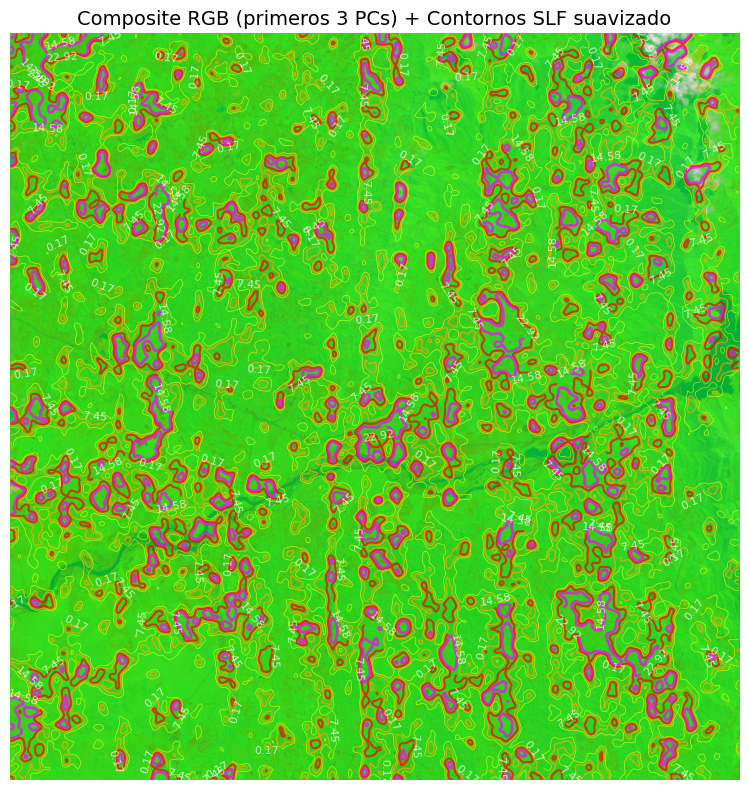

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA

# -------------------------------------------------------------------------
# ASUMIMOS que ya tienes en memoria:
# - data         : array SWIR 3D de shape (R, C, B), con B=133 bandas
# - hdr['wavelength']: array de 133 longitudes de onda (nm)
# - slf_map_fa   : array 2D (R, C) con los valores SLF por cluster
# -------------------------------------------------------------------------

# 1) Primero, aplicamos un filtro Gaussiano al mapa SLF para suavizarlo
#    Escoge sigma en píxeles (ej. 3 o 5). Ajusta según el tamaño de tu imagen 
#    para ver manchas más grandes o más pequeñas.
sigma = 5.0
slf_smooth = gaussian_filter(slf_map_fa, sigma=sigma)

# 2) Opcional: normalizar el mapa suavizado a [0, 1], para poder usarlo como alpha
slf_min, slf_max = np.min(slf_smooth), np.max(slf_smooth)
slf_norm = (slf_smooth - slf_min) / (slf_max - slf_min + 1e-12)

# 3) Queremos un composite RGB de la imagen SWIR. Dos opciones típicas:
#    a) Usar tres bandas arbitrarias (por ejemplo, bandas 30, 60 y 90).
#    b) Usar los primeros 3 componentes principales (PCA) de “pixels”.
#
#    Aquí muestro la opción (b), que suele dar colores mejor distribuidos:
R, C, B = data.shape
pixels = data.reshape(-1, B)  # (R*C, 133)

pca = PCA(n_components=3, random_state=0)
X_pca3 = pca.fit_transform(pixels)  # (R*C, 3)

# Reconstruimos la imagen PCA-3D como RGB (shape (R, C, 3))
rgb_pca = X_pca3.reshape(R, C, 3)

# Normalizamos cada canal PCA a [0,1] para visualizar
# (por píxel: restamos el mínimo y dividimos por el rango)
rgb_min = rgb_pca.min(axis=(0, 1))
rgb_max = rgb_pca.max(axis=(0, 1))
rgb_norm = (rgb_pca - rgb_min) / (rgb_max - rgb_min + 1e-12)

# 4) Ahora dibujamos el composite RGB y “overlay” del SLF suavizado.
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(rgb_norm, origin='lower')
ax.set_title("Composite RGB (primeros 3 PCs) + Contornos SLF suavizado", fontsize=14)
ax.axis('off')

# 5) Dibujar contornos del mapa SLF suavizado.
#    Puedes elegir varios niveles, por ejemplo en percentiles de slf_smooth:
levels = np.percentile(slf_smooth, [50, 70, 85, 95])  # por ejemplo
cont = ax.contour(
    slf_smooth,
    levels=levels,
    colors=['yellow', 'orange', 'red', 'magenta'],
    linewidths=[0.5, 1, 1.5, 2],
    alpha=0.7
)
# Añadir etiquetas de nivel (opcional)
ax.clabel(cont, fmt="%.2f", colors='white', fontsize=8)

plt.tight_layout()
plt.show()

# --- FIN DEL SCRIPT ---


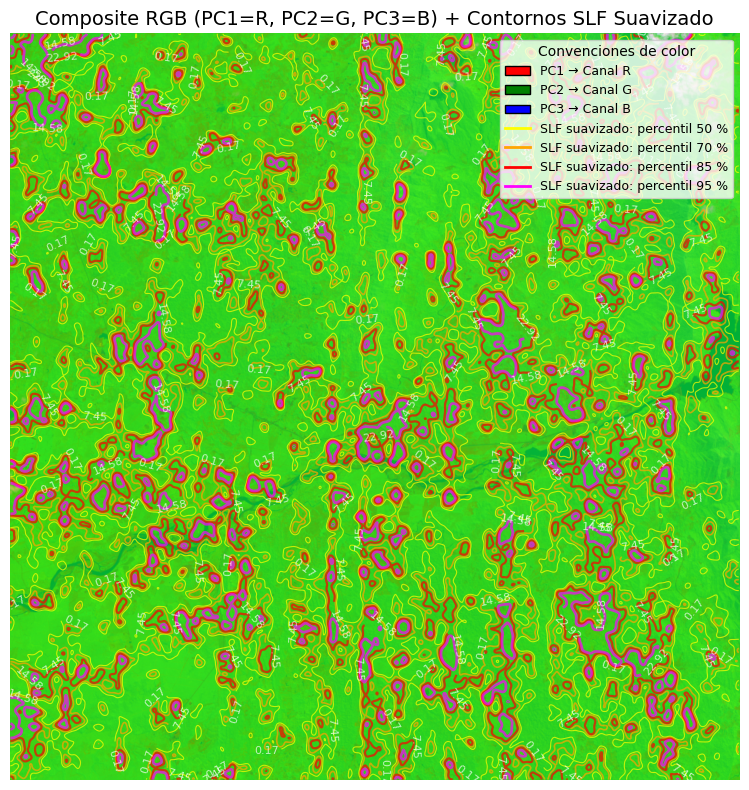

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# -------------------------------------------------------------------------
# Asumimos que ya tienes en memoria:
# - data         : array SWIR 3D de shape (R, C, B), B = 133 bandas
# - hdr['wavelength']: array de 133 longitudes de onda (nm)
# - slf_map_fa   : array 2D (R, C) con los valores SLF por cluster
# -------------------------------------------------------------------------

# 1) Suavizar el mapa SLF con un filtro gaussiano
sigma = 5.0
slf_smooth = gaussian_filter(slf_map_fa, sigma=sigma)

# 2) Normalizar a [0,1] para usarlo como “mapa de opacidad” si se desea
slf_min, slf_max = np.min(slf_smooth), np.max(slf_smooth)
slf_norm = (slf_smooth - slf_min) / (slf_max - slf_min + 1e-12)

# 3) Crear un composite RGB usando los primeros 3 componentes principales (PCA) de la imagen SWIR
R, C, B = data.shape
pixels = data.reshape(-1, B)  # (R*C, 133)

pca = PCA(n_components=3, random_state=0)
X_pca3 = pca.fit_transform(pixels)  # (R*C, 3)

# Reconstruimos la imagen PCA-3D como RGB (shape (R, C, 3))
rgb_pca = X_pca3.reshape(R, C, 3)

# Normalizamos cada canal a [0,1]
rgb_min = rgb_pca.min(axis=(0, 1))
rgb_max = rgb_pca.max(axis=(0, 1))
rgb_norm = (rgb_pca - rgb_min) / (rgb_max - rgb_min + 1e-12)

# 4) Visualización: composite RGB + contornos SLF suavizado
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(rgb_norm, origin='lower')
ax.set_title("Composite RGB (PC1=R, PC2=G, PC3=B) + Contornos SLF Suavizado", fontsize=14)
ax.axis('off')

# 5) Dibujar contornos del mapa SLF suavizado en niveles percentiles
levels = np.percentile(slf_smooth, [50, 70, 85, 95])
contours = ax.contour(
    slf_smooth,
    levels=levels,
    colors=['yellow', 'orange', 'red', 'magenta'],
    linewidths=[0.8, 1.2, 1.6, 2.0],
    alpha=0.7
)
# Etiquetas de nivel (opcional)
ax.clabel(contours, fmt="%.2f", colors='white', fontsize=8)

# 6) Construir la leyenda manualmente
legend_elements = [
    # Parches para indicar la correspondencia de cada canal RGB
    Patch(facecolor='red',   edgecolor='k', label='PC1 → Canal R'),
    Patch(facecolor='green', edgecolor='k', label='PC2 → Canal G'),
    Patch(facecolor='blue',  edgecolor='k', label='PC3 → Canal B'),
    # Líneas de ejemplo para cada nivel de contorno SLF
    Line2D([0], [0], color='yellow', lw=2, label='SLF suavizado: percentil 50 %'),
    Line2D([0], [0], color='orange', lw=2, label='SLF suavizado: percentil 70 %'),
    Line2D([0], [0], color='red', lw=2, label='SLF suavizado: percentil 85 %'),
    Line2D([0], [0], color='magenta', lw=2, label='SLF suavizado: percentil 95 %')
]

# Colocar la leyenda sobre la figura
ax.legend(
    handles=legend_elements,
    loc='upper right',
    framealpha=0.8,
    fontsize=9,
    title="Convenciones de color"
)

plt.tight_layout()
plt.show()


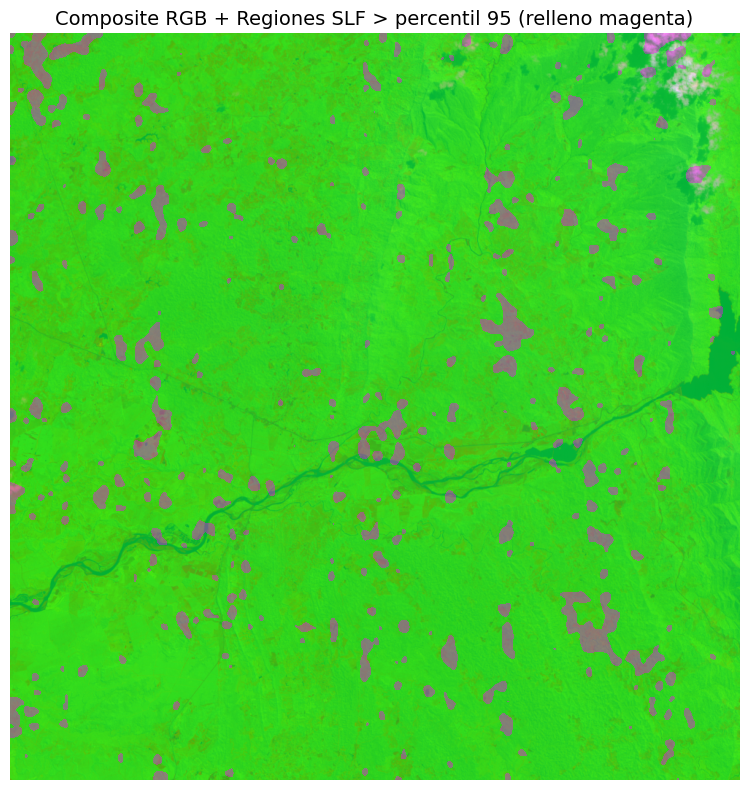

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# — Asumimos que tienes en memoria:
#   data       : (R, C, B)
#   hdr['wavelength'] : array band centroids
#   slf_map_fa : mapa SLF 2D (R, C)

# 1) Suavizar el SLF (si no lo tienes ya hecho)
sigma = 5.0
slf_smooth = gaussian_filter(slf_map_fa, sigma=sigma)

# 2) Calcular umbral 95 %
umbral_95 = np.percentile(slf_smooth.flatten(), 95)

# 3) Generar el composite RGB con PCA (o bien con bandas, si prefieres)
R, C, B = data.shape
pixels = data.reshape(-1, B)

pca = PCA(n_components=3, random_state=0)
X_pca3 = pca.fit_transform(pixels)  # (R*C, 3)
rgb_pca = X_pca3.reshape(R, C, 3)
rgb_min = rgb_pca.min(axis=(0,1))
rgb_max = rgb_pca.max(axis=(0,1))
rgb_norm = (rgb_pca - rgb_min) / (rgb_max - rgb_min + 1e-12)

# 4) Dibujar el composite de fondo
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(rgb_norm, origin='lower')
ax.set_title("Composite RGB + Regiones SLF > percentil 95 (relleno magenta)", fontsize=14)
ax.axis('off')

# 5) Usar contourf para rellenar solo el “nivel 95” con color magenta semitransparente
#    Definimos el arreglo de niveles: un dato justo por encima de umbral_95 y otro muy grande
levels = [umbral_95, slf_smooth.max() + 1e-3]

#    Dibujamos uno solo de los “cojinetes” entre umbral_95 y el máximo, con color magenta
cf = ax.contourf(
    slf_smooth,
    levels=levels,
    colors=['magenta'], 
    alpha=0.4,           # ajuste de transparencia (0.0–1.0)
    origin='lower',
)

plt.tight_layout()
plt.show()


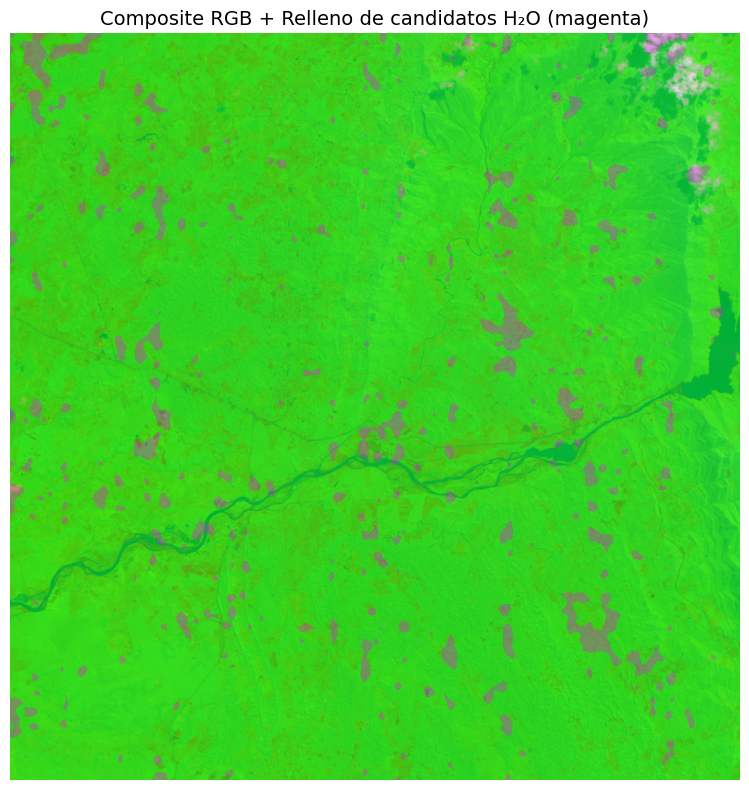

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA

# — Asumimos que:
#   data       : (R, C, B)
#   hdr['wavelength'] : array band centroids
#   slf_map_fa : mapa SLF 2D (R, C)

# 1) Suavizar SLF (si no lo tienes)
sigma = 5.0
slf_smooth = gaussian_filter(slf_map_fa, sigma=sigma)

# 2) Generar máscara de “candidatos fuertes” (SLF > percentil 95)
umbral_95 = np.percentile(slf_smooth.flatten(), 95)
mascara_h2o = slf_smooth > umbral_95  # True donde hay “mejor candidato”

# 3) Composite RGB por PCA
R, C, B = data.shape
pixels = data.reshape(-1, B)

pca = PCA(n_components=3, random_state=0)
X_pca3 = pca.fit_transform(pixels)  
rgb_pca = X_pca3.reshape(R, C, 3)
rgb_min = rgb_pca.min(axis=(0,1))
rgb_max = rgb_pca.max(axis=(0,1))
rgb_norm = (rgb_pca - rgb_min) / (rgb_max - rgb_min + 1e-12)

# 4) Dibujar el fondo RGB
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(rgb_norm, origin='lower')
ax.set_title("Composite RGB + Relleno de candidatos H₂O (magenta)", fontsize=14)
ax.axis('off')

# 5) Crear una capa RGBA para la máscara
#    - Definimos una imagen de color magenta con alpha 0.3 en las regiones True
#    - False → será totalmente transparente
layer = np.zeros((R, C, 4), dtype=float)  # cuatro canales: R,G,B, alpha

# Color magenta = (1.0, 0.0, 1.0) en RGB
# Alpha = 0.3 (transparencia 70 %)
layer[..., 0] = 1.0  # rojo
layer[..., 1] = 0.0  # verde
layer[..., 2] = 1.0  # azul
layer[..., 3] = 0.3  # alfa 

# Pero solo queremos esos valores en los píxeles de la máscara; donde no, alpha = 0
layer[..., 3] = np.where(mascara_h2o, 0.3, 0.0)

# 6) Superponer con imshow
ax.imshow(layer, origin='lower')
plt.tight_layout()
plt.show()


Tamaños de cada cluster:
  Cluster 00: 18 píxeles ⚠️ PEQUEÑO
  Cluster 01: 90595 píxeles 
  Cluster 02: 172912 píxeles 
  Cluster 03: 241362 píxeles 
  Cluster 04: 280161 píxeles 
  Cluster 05: 17803 píxeles 
  Cluster 06: 104197 píxeles 
  Cluster 07: 83035 píxeles 
  Cluster 08: 26202 píxeles 
  Cluster 09: 7715 píxeles 

Reasignando clusters pequeños: [0]
Después de reasignar:
  Cluster 00: 0 píxeles ⚠️ PEQUEÑO
  Cluster 01: 90595 píxeles 
  Cluster 02: 172912 píxeles 
  Cluster 03: 241362 píxeles 
  Cluster 04: 280179 píxeles 
  Cluster 05: 17803 píxeles 
  Cluster 06: 104197 píxeles 
  Cluster 07: 83035 píxeles 
  Cluster 08: 26202 píxeles 
  Cluster 09: 7715 píxeles 
⚠️ Cluster 0 muy pequeño (n=0). Intentamos regularizar más.
  • Cluster 0 mal condicionado, se usó fallback I/ε=1.0e+00


/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/tmp/ipykernel_560/781788846.py:125: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov_k = np.cov(pixels_k, rowvar=False)            # (133,133)
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value 

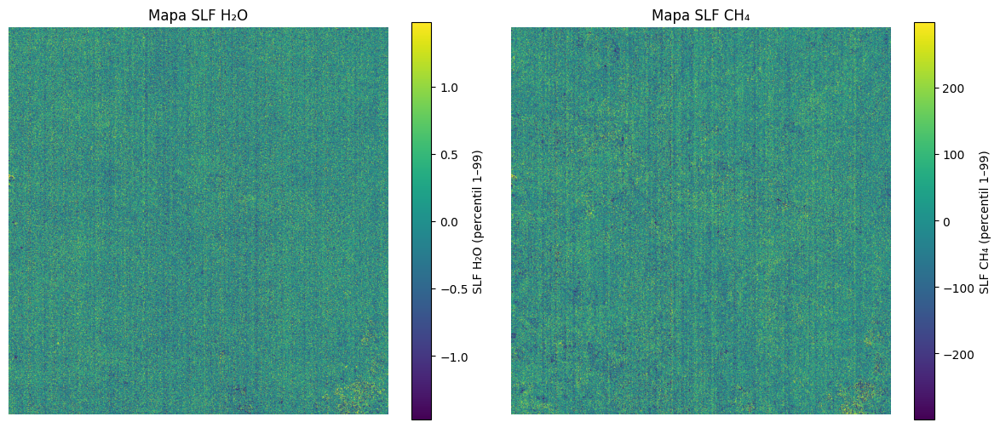

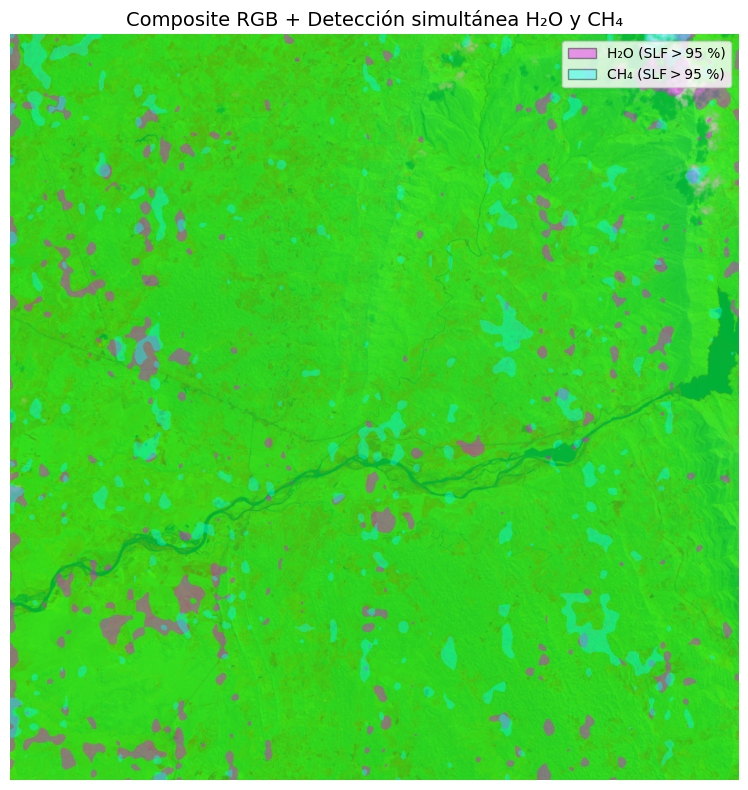

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.ndimage import gaussian_filter
from collections import Counter

# -------------------------------------------------------------------------
# A) Supongamos que ya tienes cargado en memoria:
#    - data         : array SWIR 3D de shape (R, C, B), con B = 133 bandas
#    - hdr['wavelength']: array de 133 longitudes de onda (en nm)
# -------------------------------------------------------------------------

# ---------------------------------------------------
# PASO 1: CARGAR E INTERPOLAR LAS FIRMAS DE H₂O y CH₄
# ---------------------------------------------------
# Firma H₂O (ya filtrada, en [nm, atenuación_normalizada])
raw_h2o = np.loadtxt('/home/jleon13/Documents/Proyecto_5/H2O_atenuation_filtered.txt')
w_h2o_orig = raw_h2o[:, 0]  # [nm]
a_h2o_orig = raw_h2o[:, 1]  # normalizada

# Firma CH₄ (idem)
raw_ch4 = np.loadtxt('/home/jleon13/Documents/Proyecto_5/CH4_atenuation_filtered.txt')
w_ch4_orig = raw_ch4[:, 0]
a_ch4_orig = raw_ch4[:, 1]

# Longitudes de onda de la imagen SWIR (133 valores)
wavelengths_img = np.array([float(w) for w in hdr['wavelength']])  # (133,)

# Interpolar H₂O a las longitudes de la imagen
a_h2o_interp = np.interp(wavelengths_img, w_h2o_orig, a_h2o_orig)
t_h2o = a_h2o_interp.reshape(-1, 1)  # (133,1)

# Interpolar CH₄ a las longitudes de la imagen
a_ch4_interp = np.interp(wavelengths_img, w_ch4_orig, a_ch4_orig)
t_ch4 = a_ch4_interp.reshape(-1, 1)  # (133,1)

# ---------------------------------------------------
# PASO 2: PREPARAR PIXELES Y ESTADÍSTICAS GLOBALES
# ---------------------------------------------------
R, C, B = data.shape
pixels = data.reshape(-1, B)  # (R*C, 133)

# Media global del fondo
mu_global = np.mean(pixels, axis=0).reshape(-1, 1)  # (133,1)

# Covarianza global del fondo
cov_global = np.cov(pixels, rowvar=False)  # (133,133)
# Para Mahalanobis: obtener Σ^{-1/2} global
eigvals, eigvecs = np.linalg.eigh(cov_global)
eps_eig = 1e-6
eigvals_clipped = np.maximum(eigvals, eps_eig)
cov_global_inv_sqrt = eigvecs @ np.diag(1.0/np.sqrt(eigvals_clipped)) @ eigvecs.T  # (133,133)
# Y guardamos la pseudoinversa solo en caso de test sintético
cov_global_inv = np.linalg.pinv(cov_global)

# -------------------------------------------------------------------------
# PASO 3: CLUSTERING MAHALANOBIS + INICIALIZACIÓN “EXTREMA” (UNA SOLA VEZ)
# -------------------------------------------------------------------------
n_clusters = 10

# “Whitening” Mahalanobis
pixels_centered = pixels - mu_global.ravel()            # (N,133)
pixels_whitened = pixels_centered @ cov_global_inv_sqrt  # (N,133)
N = pixels_whitened.shape[0]

# Inicialización extrema en PC1
pca_init = PCA(n_components=1, random_state=0)
pc1_scores = pca_init.fit_transform(pixels_whitened).ravel()  # (N,)
sorted_idx = np.argsort(pc1_scores)
positions = (np.linspace(0, N-1, n_clusters)).astype(int)
init_centroids = pixels_whitened[sorted_idx[positions]]      # (n_clusters,133)

# KMeans (Mahalanobis implícito por whitening)
kmeans = KMeans(
    n_clusters=n_clusters,
    init=init_centroids,
    n_init=1,
    max_iter=300,
    random_state=0
)
labels = kmeans.fit_predict(pixels_whitened)  # (N,)
labels_img = labels.reshape(R, C)             # (R,C)

# Chequear tamaños de cluster
counts = Counter(labels)
print("Tamaños de cada cluster:")
for k in range(n_clusters):
    tag = "⚠️ PEQUEÑO" if counts[k] < B else ""
    print(f"  Cluster {k:02d}: {counts[k]} píxeles {tag}")

# Reasignar clusters muy pequeños (< B) al cluster más grande
small_labels = [k for k, n_k in counts.items() if n_k < B]
if small_labels:
    print("\nReasignando clusters pequeños:", small_labels)
    for k_small in small_labels:
        idx_small = np.where(labels == k_small)[0]
        # elegimos cluster más poblado ≠ k_small
        k_target = max(((k, n) for k,n in counts.items() if k!=k_small), key=lambda x: x[1])[0]
        labels[idx_small] = k_target
    counts = Counter(labels)
    print("Después de reasignar:")
    for k in range(n_clusters):
        tag = "⚠️ PEQUEÑO" if counts[k] < B else ""
        print(f"  Cluster {k:02d}: {counts[k]} píxeles {tag}")
    labels_img = labels.reshape(R, C)

# -------------------------------------------------------------------------
# PASO 4: CALCULAR MEDIAS Y COVARIANZAS REGULARIZADAS POR CLUSTER
# -------------------------------------------------------------------------
base_epsilon = 1e-3
means       = []
covs_inv    = []

for k in range(n_clusters):
    idx_k    = (labels == k)
    pixels_k = pixels[idx_k]  # (n_k,133)
    n_k      = pixels_k.shape[0]
    if n_k < B:
        print(f"⚠️ Cluster {k} muy pequeño (n={n_k}). Intentamos regularizar más.")

    # Media de cluster k
    mean_k = np.mean(pixels_k, axis=0).reshape(-1,1)  # (133,1)
    # Covarianza de cluster k
    cov_k = np.cov(pixels_k, rowvar=False)            # (133,133)

    # Intentar pseudo‐inversa con regularización adaptativa
    eps = base_epsilon
    while True:
        try:
            cov_k_reg = cov_k + eps * np.eye(B)
            cov_k_inv = np.linalg.pinv(cov_k_reg)
            break
        except np.linalg.LinAlgError:
            eps *= 10
            if eps > 1e-1:
                # fallback muy robusto
                cov_k_inv = np.eye(B) / eps
                print(f"  • Cluster {k} mal condicionado, se usó fallback I/ε={eps:.1e}")
                break

    means.append(mean_k)      # (133,1)
    covs_inv.append(cov_k_inv)  # (133,133)

means    = np.concatenate(means, axis=1)  # (133, n_clusters)
covs_inv = np.stack(covs_inv,   axis=0)   # (n_clusters,133,133)

# -------------------------------------------------------------------------
# PASO 5: CALCULAR DOS MAPAS SLF (H₂O y CH₄) POR CLUSTER
# -------------------------------------------------------------------------
slf_map_h2o = np.zeros((R, C), dtype=np.float32)
slf_map_ch4 = np.zeros((R, C), dtype=np.float32)

for i in range(R):
    for j in range(C):
        k     = labels_img[i, j]
        xij   = data[i, j, :].reshape(-1, 1)       # (133,1)
        diff  = xij - means[:, [k]]                # (133,1)

        # Para H₂O
        num_h2o = float(diff.T @ covs_inv[k] @ t_h2o)
        den_h2o = float(t_h2o.T   @ covs_inv[k] @ t_h2o)
        slf_map_h2o[i, j] = 0.0 if np.isclose(den_h2o, 0.0) else (num_h2o / den_h2o)

        # Para CH₄
        num_ch4 = float(diff.T @ covs_inv[k] @ t_ch4)
        den_ch4 = float(t_ch4.T   @ covs_inv[k] @ t_ch4)
        slf_map_ch4[i, j] = 0.0 if np.isclose(den_ch4, 0.0) else (num_ch4 / den_ch4)

# Mostrar rápidamente ambos mapas SLF
vmin_h2o, vmax_h2o = np.percentile(slf_map_h2o.flatten(), [1, 99])
vmin_ch4, vmax_ch4 = np.percentile(slf_map_ch4.flatten(), [1, 99])

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(slf_map_h2o, cmap='viridis', vmin=vmin_h2o, vmax=vmax_h2o)
plt.colorbar(label='SLF H₂O (percentil 1–99)')
plt.title('Mapa SLF H₂O')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(slf_map_ch4, cmap='viridis', vmin=vmin_ch4, vmax=vmax_ch4)
plt.colorbar(label='SLF CH₄ (percentil 1–99)')
plt.title('Mapa SLF CH₄')
plt.axis('off')
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------------
# PASO 6: SUAVIZAR CADA MAPA Y GENERAR MÁSCARAS BINARIAS POR UMBRAL
#              (por ejemplo percentil 95 en cada gas)
# -------------------------------------------------------------------------
# a) Suavizar con Gaussiano
sigma = 5.0
slf_h2o_smooth = gaussian_filter(slf_map_h2o, sigma=sigma)
slf_ch4_smooth = gaussian_filter(slf_map_ch4, sigma=sigma)

# b) Obtener umbrales 95 % (cada mapa separado)
th_h2o = np.percentile(slf_h2o_smooth.flatten(), 95)
th_ch4 = np.percentile(slf_ch4_smooth.flatten(), 95)

# c) Crear máscaras booleanas
mask_h2o = (slf_h2o_smooth > th_h2o)  # True donde H₂O muy probable
mask_ch4 = (slf_ch4_smooth > th_ch4)  # True donde CH₄ muy probable

# -------------------------------------------------------------------------
# PASO 7: CREAR UN COMPOSITE RGB DE FONDO (PCA) Y “OVERLAY” DE máscaras
# -------------------------------------------------------------------------
# 1) Composite RGB con PCA (PC1=R, PC2=G, PC3=B)
pca = PCA(n_components=3, random_state=0)
X_pca3 = pca.fit_transform(pixels)    # (R*C, 3)
rgb_pca = X_pca3.reshape(R, C, 3)
rgb_min, rgb_max = rgb_pca.min(axis=(0,1)), rgb_pca.max(axis=(0,1))
rgb_norm = (rgb_pca - rgb_min) / (rgb_max - rgb_min + 1e-12)

# 2) Visualizar fondo
fig, ax = plt.subplots(figsize=(10,8))
ax.imshow(rgb_norm, origin='lower')
ax.set_title("Composite RGB + Detección simultánea H₂O y CH₄", fontsize=14)
ax.axis('off')

# 3) Crear una capa RGBA donde:
#    - H₂O → color magenta semitransparente
#    - CH₄ → color cian semitransparente
layer = np.zeros((R, C, 4), dtype=float)  # (R,C,R,G,B,alpha)

#  H₂O  → (1.0, 0.0, 1.0)  
layer[..., 0] = 1.0  # rojo del magenta
layer[..., 1] = 0.0  # verde del magenta
layer[..., 2] = 1.0  # azul del magenta
# solo activar alpha donde mask_h2o == True
layer[..., 3] = np.where(mask_h2o, 0.4, 0.0)  # 0.4 = 40% opacity para magenta

#  CH₄  → (0.0, 1.0, 1.0)
layer_ch4 = np.zeros((R, C, 4), dtype=float)
layer_ch4[..., 0] = 0.0  # rojo del cian
layer_ch4[..., 1] = 1.0  # verde del cian
layer_ch4[..., 2] = 1.0  # azul del cian
layer_ch4[..., 3] = np.where(mask_ch4, 0.4, 0.0)  # 40% opacity para cian

# 4) Superponer: primero H₂O, luego CH₄ encima
ax.imshow(layer,   origin='lower')
ax.imshow(layer_ch4, origin='lower')

# 5) Añadir leyenda simple (recuadro)
from matplotlib.patches import Patch
legend_items = [
    Patch(facecolor='magenta', edgecolor='k', alpha=0.4, label='H₂O (SLF > 95 %)'),
    Patch(facecolor='cyan',    edgecolor='k', alpha=0.4, label='CH₄ (SLF > 95 %)')
]
ax.legend(handles=legend_items, loc='upper right', framealpha=0.8, fontsize=10)

plt.tight_layout()
plt.show()


# ***Convolution like the paper***

Tamaños de cada cluster tras KMeans (Mahalanobis):
  Cluster 00: 18 píxeles ⚠️
  Cluster 01: 90595 píxeles 
  Cluster 02: 172912 píxeles 
  Cluster 03: 241362 píxeles 
  Cluster 04: 280161 píxeles 
  Cluster 05: 17803 píxeles 
  Cluster 06: 104197 píxeles 
  Cluster 07: 83035 píxeles 
  Cluster 08: 26202 píxeles 
  Cluster 09: 7715 píxeles 

Reasignando clusters demasiado pequeños: [0]
Tamaños de cluster tras reasignar pequeños:
  Cluster 00: 0 píxeles ⚠️
  Cluster 01: 90595 píxeles 
  Cluster 02: 172912 píxeles 
  Cluster 03: 241362 píxeles 
  Cluster 04: 280179 píxeles 
  Cluster 05: 17803 píxeles 
  Cluster 06: 104197 píxeles 
  Cluster 07: 83035 píxeles 
  Cluster 08: 26202 píxeles 
  Cluster 09: 7715 píxeles 
⚠️  Cluster 0 con n=0 < B=133, se regularizará.
  • Cluster 0 muy mal condicionado, fallback ε=1.0e+00


/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/tmp/ipykernel_560/2762430764.py:117: RuntimeWarning: Degrees of freedom <= 0 for slice
  cov_k = np.cov(pixels_k, rowvar=False)
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/jleon13/miniconda3/envs/standoff/lib/python3.10/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multipl

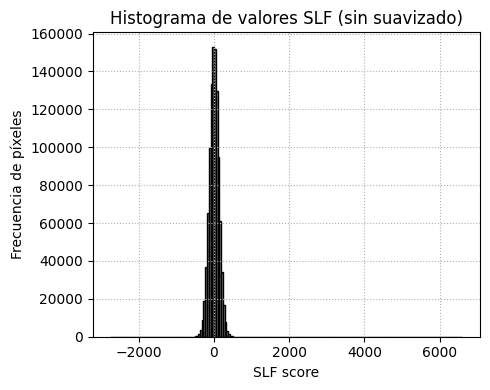

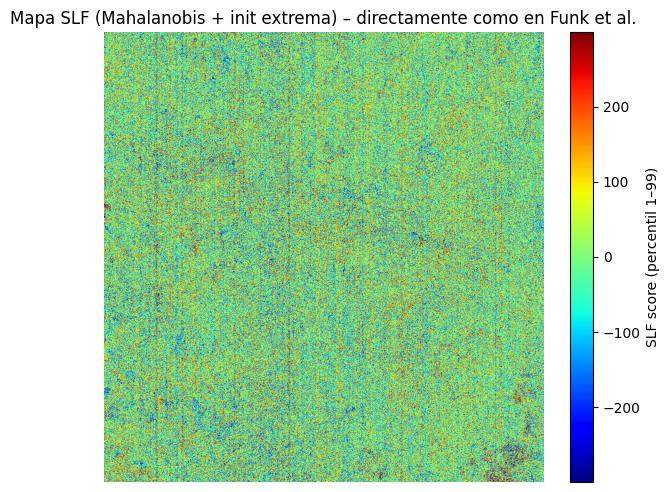

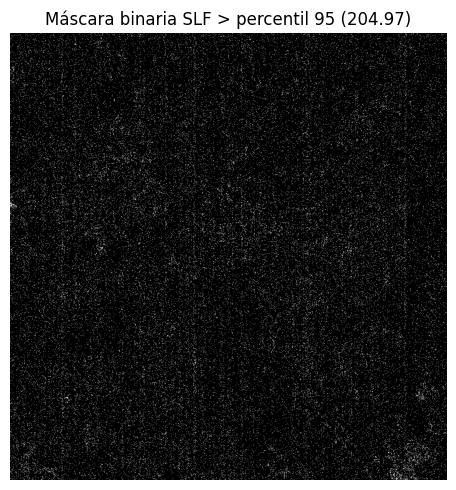

Número de píxeles con SLF > percentil 95: 51200


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from collections import Counter

# -------------------------------------------------------------------------
# --- ASUMIMOS que ya tienes en memoria:
# ---  data            : SWIR 3D array de shape (R, C, B), B = 133 bandas
# ---  hdr['wavelength']: array de 133 longitudes de onda (nm)
# -------------------------------------------------------------------------

# -------------------------------------------------------------------------
# PASO A: CARGAR E INTERPOLAR LA FIRMA DEL GAS (H2O o CH4, por ejemplo)
# -------------------------------------------------------------------------
# 1) Leer firma ya filtrada (λ en nm + atenuación normalizada)
firma = np.loadtxt('/home/jleon13/Documents/Proyecto_5/CH4_atenuation_filtered.txt')
w_firma_orig = firma[:, 0]   # longitudes de onda originales (nm)
a_firma_orig = firma[:, 1]   # atenuación normalizada

# 2) Reconstruir vector de longitudes de banda SWIR
wavelengths_img = np.array([float(w) for w in hdr['wavelength']])  # (133,)

# 3) Interpolar la firma sobre las longitudes de onda de la imagen
a_firma_interp = np.interp(wavelengths_img, w_firma_orig, a_firma_orig)

# 4) Transformar en vector columna (133×1)
t_vec = a_firma_interp.reshape(-1, 1)  # (133, 1)

# -------------------------------------------------------------------------
# PASO B: CALCULAR MEDIA Y COVARIANZA GLOBAL (FONDO)
# -------------------------------------------------------------------------
R, C, B = data.shape
pixels = data.reshape(-1, B)  # (R*C, 133)

# 1) Media global (133×1)
mu_global = np.mean(pixels, axis=0).reshape(-1, 1)

# 2) Covarianza global (133×133)
cov_global = np.cov(pixels, rowvar=False)

# 3) Matriz de whitening global para Mahalanobis: Σ_global^(-1/2)
eigvals, eigvecs = np.linalg.eigh(cov_global)
eps_eig = 1e-6
eigvals_clipped = np.maximum(eigvals, eps_eig)
cov_global_inv_sqrt = eigvecs @ np.diag(1.0 / np.sqrt(eigvals_clipped)) @ eigvecs.T

# -------------------------------------------------------------------------
# PASO C: CLUSTERING MAHALANOBIS + INICIALIZACIÓN “EXTREMA”
# -------------------------------------------------------------------------
n_clusters = 10

# 1) “Whitening” Mahalanobis
pixels_centered  = pixels - mu_global.ravel()        # (N,133)
pixels_whitened  = pixels_centered @ cov_global_inv_sqrt  # (N,133)
N = pixels_whitened.shape[0]

# 2) Inicialización extrema (PC1) para KMeans
pca_init   = PCA(n_components=1, random_state=0)
pc1_scores = pca_init.fit_transform(pixels_whitened).ravel()  # (N,)
sorted_idx = np.argsort(pc1_scores)
positions  = (np.linspace(0, N - 1, n_clusters)).astype(int)
init_centroids = pixels_whitened[sorted_idx[positions]]       # (n_clusters,133)

# 3) Ejecutar KMeans sobre pixels_whitened (Mahalanobis implícito)
kmeans = KMeans(
    n_clusters=n_clusters,
    init=init_centroids,
    n_init=1,
    max_iter=300,
    random_state=0
)
labels = kmeans.fit_predict(pixels_whitened)  # (N,)
labels_img = labels.reshape(R, C)             # (R, C)

# 4) Mostrar tamaños de cluster y reasignar clusters muy pequeños
counts = Counter(labels)
print("Tamaños de cada cluster tras KMeans (Mahalanobis):")
for k in range(n_clusters):
    tag = "⚠️" if counts[k] < B else ""
    print(f"  Cluster {k:02d}: {counts[k]} píxeles {tag}")

# Reasignar clusters < B a cluster más grande para evitar Σ mal condicionada
small_labels = [k for k, n_k in counts.items() if n_k < B]
if small_labels:
    print("\nReasignando clusters demasiado pequeños:", small_labels)
    for k_small in small_labels:
        idx_small = np.where(labels == k_small)[0]
        k_target = max(((k, n) for k, n in counts.items() if k != k_small),
                       key=lambda x: x[1])[0]
        labels[idx_small] = k_target
    counts = Counter(labels)
    print("Tamaños de cluster tras reasignar pequeños:")
    for k in range(n_clusters):
        tag = "⚠️" if counts[k] < B else ""
        print(f"  Cluster {k:02d}: {counts[k]} píxeles {tag}")
    labels_img = labels.reshape(R, C)

# -------------------------------------------------------------------------
# PASO D: CALCULAR MEDIAS Y COVARIANZAS REGULARIZADAS POR CLUSTER
# -------------------------------------------------------------------------
means    = []
covs_inv = []
base_eps = 1e-3

for k in range(n_clusters):
    idx_k    = (labels == k)
    pixels_k = pixels[idx_k]  # (n_k,133)
    n_k      = pixels_k.shape[0]
    if n_k < B:
        print(f"⚠️  Cluster {k} con n={n_k} < B={B}, se regularizará.")

    # Media de cluster k (133×1)
    mean_k = np.mean(pixels_k, axis=0).reshape(-1, 1)

    # Covarianza de cluster k (133×133)
    cov_k = np.cov(pixels_k, rowvar=False)

    # Intentar pseudo‐inversa con ε adaptativo
    eps = base_eps
    while True:
        try:
            cov_k_reg = cov_k + eps * np.eye(B)
            cov_k_inv = np.linalg.pinv(cov_k_reg)
            break
        except np.linalg.LinAlgError:
            eps *= 10
            if eps > 1e-1:
                cov_k_inv = np.eye(B) / eps
                print(f"  • Cluster {k} muy mal condicionado, fallback ε={eps:.1e}")
                break

    means.append(mean_k)      # (133×1)
    covs_inv.append(cov_k_inv)  # (133×133)

means    = np.concatenate(means,   axis=1)   # (133, n_clusters)
covs_inv = np.stack(covs_inv, axis=0)        # (n_clusters, 133, 133)

# -------------------------------------------------------------------------
# PASO E: CALCULAR EL MAPA SLF 2D (HASTA AQUÍ TODO COMO EN EL PAPER)
# -------------------------------------------------------------------------
slf_map = np.zeros((R, C), dtype=np.float32)

for i in range(R):
    for j in range(C):
        k    = labels_img[i, j]
        xij  = data[i, j, :].reshape(-1, 1)  # (133,1)
        diff = xij - means[:, [k]]           # (133,1)

        num = float(diff.T @ covs_inv[k] @ t_vec)    # numerador
        den = float(t_vec.T   @ covs_inv[k] @ t_vec) # denominador

        slf_map[i, j] = 0.0 if np.isclose(den, 0.0) else (num / den)

# -------------------------------------------------------------------------
# PASO F: VISUALIZAR EL MAPA SLF 2D (SIN SUAVIZADO ESPACIAL)
# -------------------------------------------------------------------------
# 1) Histograma de distribución de valores SLF (opcional)
vals = slf_map.flatten()
vals_nonzero = vals[np.abs(vals) > 1e-8]
plt.figure(figsize=(5,4))
plt.hist(vals_nonzero, bins=200, color='gray', edgecolor='black')
plt.title("Histograma de valores SLF (sin suavizado)")
plt.xlabel("SLF score")
plt.ylabel("Frecuencia de píxeles")
plt.grid(True, ls=':')
plt.tight_layout()
plt.show()

# 2) Visualizar el mapa SLF con colormap y recorte percentil 1–99
vmin, vmax = np.percentile(vals_nonzero, [1, 99])
plt.figure(figsize=(6,5))
plt.imshow(slf_map, cmap='jet', vmin=vmin, vmax=vmax)
plt.colorbar(label='SLF score (percentil 1–99)')
plt.title("Mapa SLF (Mahalanobis + init extrema) – directamente como en Funk et al.")
plt.axis('off')
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------------
# (OPCIONAL) PASO G: GENERAR MÁSCARA DE DETECCIÓN E IDENTIFICAR PÍXELES
#                 CON SLF MAYOR QUE UN UMBRAL (p.ej. percentil 95)
# -------------------------------------------------------------------------
threshold = np.percentile(slf_map.flatten(), 95)
mask_det = (slf_map > threshold)  # True = píxel con SLF muy alto

# Mostrar mapa de detección binaria
plt.figure(figsize=(6,5))
plt.imshow(mask_det, cmap='gray')
plt.title(f"Máscara binaria SLF > percentil 95 ({threshold:.2f})")
plt.axis('off')
plt.tight_layout()
plt.show()

# Si quieres extraer coordenadas de píxeles detectados:
coords = np.column_stack(np.nonzero(mask_det))
print(f"Número de píxeles con SLF > percentil 95: {coords.shape[0]}")
# coords es una lista de (fila, columna) para cada detección


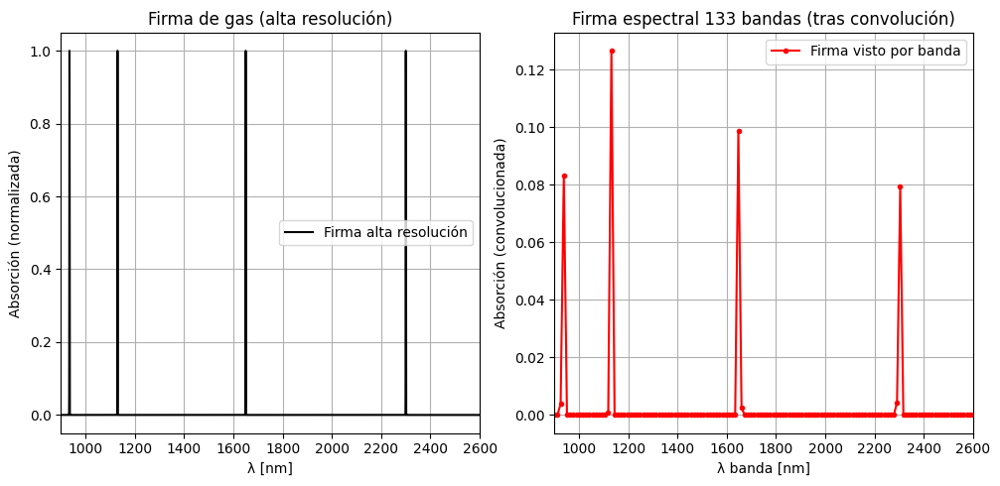

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import fftconvolve

# ---------------------------------------------------------------------
# Paso 0: Supongamos que ya tienes cargados/definidos:
#
# 1) Firma de gas de alta resolución (“sig_high”):
#     w_high      → array 1D de longitudes de onda [nm], por ejemplo
#                    desde 900 nm hasta 2600 nm en pasos de 0.1 nm.
#     sig_high    → array 1D de la misma longitud, valor de atenuación
#                    o transmitancia normalizada en cada w_high.
#
# 2) Centroides de bandas SWIR (hdr['wavelength']), 133 valores en [nm]:
#     w_bands     = np.array([float(w) for w in hdr['wavelength']])  # shape (133,)
#
# 3) Si dispones de la verdadera SRF de cada banda, deberías cargarla aquí.
#    A efectos de ejemplo, vamos a **aproximar cada SRF** como un Gaussiano
#    centrado en w_bands[b] con un ancho (FWHM) fijo de, digamos, 8 nm.
#
#    En la realidad, quizá tu sensor te dé un archivo .csv con SRF(b,λ_high).
#    Aquí mostramos cómo generar un Gaussiano aproximado para cada banda.
# ---------------------------------------------------------------------

# Parámetros de ejemplo: 
w_bands = np.linspace(900.0, 2600.0, 133)  
FWHM_nm = 8.0   # ancho total de cada banda (en nm); ajusta según tu sensor

# ---------------------------------------------------------------------
# Paso 1: Definir w_high y sig_high de ejemplo
# ---------------------------------------------------------------------
# Para ilustrar, creamos una “firma sintética” H₂O o CH₄ de alta resolución.
# En tu caso, w_high y sig_high pueden venir de un txt exportado de HITRAN
# con resolución de 0.01 nm o similar.

# Creamos un vector w_high entre 900 nm y 2600 nm, con paso 0.1 nm (se puede afinar)
w_high = np.arange(900.0, 2600.0+0.1, 0.1)  # (17000 puntos, aprox.)

# Demo: supongamos que sig_high es una combinación de líneas gaussianas muy delgadas
# para simular absorciones de H₂O/CH4. En la práctica cargarías estos datos:
#    sig_high = np.loadtxt("firma_highres.txt", usecols=[1])  # si ya tienes
# Para fines ilustrativos, crearemos un “arreglo sintético”:
sig_high = np.zeros_like(w_high)
# Agreguemos unas líneas “ficticias” en 935 nm, 1130 nm (H2O), 1650 nm (CH4), 2300 nm (CH4/H2O)
for center in [935, 1130, 1650, 2300]:
    sigma_line = 0.5  # ancho muy estrecho, 0.5 nm
    sig_high += np.exp(-0.5 * ((w_high - center)/sigma_line)**2)

# Y normalizamos a [0,1] para que sea comparable a una firma “real”
sig_high = sig_high / np.max(sig_high)

# ---------------------------------------------------------------------
# Paso 2: Construir la SRF de cada banda como un Gaussiano en w_high
# ---------------------------------------------------------------------
# Creamos un arreglo vacío para almacenar la SRF de cada banda: tamaño (133, len(w_high))
n_bands = len(w_bands)  # 133
SRF = np.zeros((n_bands, w_high.size), dtype=np.float32)

# Convertir FWHM a sigma_gaussiano: FWHM = 2.355 * sigma
sigma_band = FWHM_nm / 2.355

for b in range(n_bands):
    centro = w_bands[b]
    # Gaussiano centrado en “centro” con sigma_band
    SRF[b, :] = np.exp(-0.5 * ((w_high - centro) / sigma_band) ** 2)
    # Normalizamos cada SRF[b] para que el área total sea 1:
    SRF[b, :] /= np.trapz(SRF[b, :], w_high)

# Ahora SRF[b, :] es un vector ~normalizado en w_high que simula la respuesta
# espectral de la banda b. En la realidad usarías el dato real proporcionado por el sensor.

# ---------------------------------------------------------------------
# Paso 3: Convolución espectral “manual” (sumatorio o trapezoidal) 
#           para obtener sig_conv[b] (firma vista por banda b)
# ---------------------------------------------------------------------
# método A: integral directa (trapecio) banda a banda
sig_conv_trap = np.zeros(n_bands, dtype=np.float32)
for b in range(n_bands):
    # ∫ sig_high(λ) · SRF[b](λ) dλ  ≈ trapz(sig_high * SRF[b], w_high)
    sig_conv_trap[b] = np.trapz(sig_high * SRF[b, :], w_high)

# método B: usando convolución con FFT (el SRF está ya normalizada)
#   fftconvolve normaliza el resultado en función del kernel automáticamente,
#   pero como aquí trabajamos en dominio λ, preferimos trapz().
#   Si quisieras, podrías hacer:
#   sig_conv_fft = fftconvolve(sig_high, SRF[b,:], mode='same') * Δλ
#   donde Δλ = w_high[1] - w_high[0] = 0.1 nm, pero hay que ajustar normalización.

# ---------------------------------------------------------------------
# Paso 4: Visualizar firma “alta resolución” vs firma “vista por bandas”
# ---------------------------------------------------------------------
plt.figure(figsize=(10,5))

# Mostrar firma de alta resolución
ax1 = plt.subplot(1,2,1)
ax1.plot(w_high, sig_high, 'k-', label='Firma alta resolución')
ax1.set_xlim(900, 2600)
ax1.set_xlabel('λ [nm]')
ax1.set_ylabel('Absorción (normalizada)')
ax1.set_title('Firma de gas (alta resolución)')
ax1.grid(True)
ax1.legend()

# Mostrar firma “convolucionada” banda a banda
ax2 = plt.subplot(1,2,2)
ax2.plot(w_bands, sig_conv_trap, 'r.-', label='Firma visto por banda')
ax2.set_xlim(900, 2600)
ax2.set_xlabel('λ banda [nm]')
ax2.set_ylabel('Absorción (convolucionada)')
ax2.set_title('Firma espectral 133 bandas (tras convolución)')
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()
